# Masked Autoencoder embedding analysis

This notebook explores the embeddings and self-attentions of the Masked Autoencoder.

## Install and import the dependencies

In [1]:
!git clone https://github.com/TeemuSo/mae-clustering.git
!pip install transformers

from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
import torchvision.transforms.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as T
from transformers import AutoFeatureExtractor, ViTModel, ViTFeatureExtractor
from glob import glob
from copy import deepcopy
import torch
from PIL import Image
import matplotlib.pyplot as plt

Cloning into 'mae-clustering'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 9 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (9/9), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.8 MB 4.0 MB/s 
     |████████████████████████████████| 182 kB 52.7 MB/s 
     |████████████████████████████████| 7.6 MB 44.0 MB/s 


## Load the data

In [2]:
class MAEDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.img_names = glob(img_dir + '/*')
        self.transform = transform
        
    def __len__(self):
        return len(self.img_names)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        with open(self.img_names[idx], 'rb') as f:
            img = Image.open(f)
            img = img.convert('RGB')
        
        if self.transform:
            img = self.transform(img)
        
        return img


def infer_model(model, extractor, img):
    feats = extractor(images=img.squeeze(0), return_tensors='pt')
    print(feats.pixel_values.shape)
    outs = model(**feats, output_attentions=True)
    last_attention_cls = outs.attentions[-1].detach()
    last_attention = deepcopy(last_attention_cls)[..., 1:, 1:].squeeze(0)
    return last_attention, last_attention_cls, outs

Load images online

In [19]:
!wget http://images.cocodataset.org/val2017/000000148957.jpg
!wget https://farm9.staticflickr.com/8377/8582031991_8b762f2c10_z.jpg
!mv *.jpg mae-clustering/data/

--2022-12-26 14:41:39--  http://images.cocodataset.org/val2017/000000148957.jpg
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.230.249, 52.217.136.1, 54.231.166.25, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.230.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 113126 (110K) [image/jpeg]
Saving to: ‘000000148957.jpg.2’

000000148957.jpg.2  100%[===================>] 110.47K   201KB/s    in 0.5s    

2022-12-26 14:41:40 (201 KB/s) - ‘000000148957.jpg.2’ saved [113126/113126]

--2022-12-26 14:41:41--  https://farm9.staticflickr.com/8377/8582031991_8b762f2c10_z.jpg
Resolving farm9.staticflickr.com (farm9.staticflickr.com)... 13.35.30.221, 2600:9000:213e:fa00:0:5a51:64c9:c681, 2600:9000:213e:2400:0:5a51:64c9:c681, ...
Connecting to farm9.staticflickr.com (farm9.staticflickr.com)|13.35.30.221|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘8582031991_8

Create dataloader based on the content of data folder

In [56]:
transform = T.Compose([
        T.Resize((640,640)),
        T.ToTensor()
])

dataset = MAEDataset('./mae-clustering/data/', transform=transform)
dataloader = DataLoader(dataset, batch_size=1)

## Load the model

In [58]:
mae_extractor = ViTFeatureExtractor.from_pretrained("facebook/vit-mae-base")
mae = ViTModel.from_pretrained("facebook/vit-mae-base")
mae.config.mask_ratio = 0

# Load DINO for comparison
from transformers import AutoFeatureExtractor, AutoModel
dino_extractor = AutoFeatureExtractor.from_pretrained("facebook/dino-vitb16")
dino = AutoModel.from_pretrained("facebook/dino-vitb16")

You are using a model of type vit_mae to instantiate a model of type vit. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at facebook/vit-mae-base were not used when initializing ViTModel: ['decoder.decoder_layers.3.intermediate.dense.weight', 'decoder.decoder_layers.1.layernorm_before.weight', 'decoder.decoder_layers.2.layernorm_before.weight', 'decoder.decoder_layers.4.attention.attention.value.weight', 'decoder.decoder_layers.5.attention.output.dense.bias', 'decoder.decoder_layers.1.attention.attention.key.bias', 'decoder.decoder_layers.2.attention.output.dense.weight', 'decoder.decoder_embed.weight', 'decoder.decoder_layers.2.output.dense.bias', 'decoder.decoder_layers.4.attention.attention.key.weight', 'decoder.decoder_layers.1.output.dense.weight', 'decoder.decoder_layers.7.intermediate.dense.weight', 'decoder.decoder_layers.3.output.dense.bias', 'decoder.decoder_layers.0.attention.attention.key.weight', 'decoder.d

### Calculate the attentions and output embeddings with MAE

In [59]:
mae_attentions_cls = []
mae_attentions = []
mae_outs = []
mae_imgs = []
for img in dataloader:
    last_attention, last_attention_cls, out = infer_model(mae, mae_extractor, img)
    img = T.ToPILImage()(img.squeeze(0))
    mae_attentions_cls.append(last_attention_cls)
    mae_attentions.append(last_attention)
    mae_outs.append(out)
    mae_imgs.append(img)

torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


### Calculate the attentions and output embeddings with DINO

In [60]:
dino_attentions_cls = []
dino_attentions = []
dino_outs = []
dino_imgs = []
for img in dataloader:
    last_attention, last_attention_cls, out = infer_model(dino, dino_extractor, img)
    img = T.ToPILImage()(img.squeeze(0))
    dino_attentions_cls.append(last_attention_cls)
    dino_attentions.append(last_attention)
    dino_outs.append(out)
    dino_imgs.append(img)

torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


Visualize the self-attentions

## MAE self-attention visualizations

### CLS-to-rest

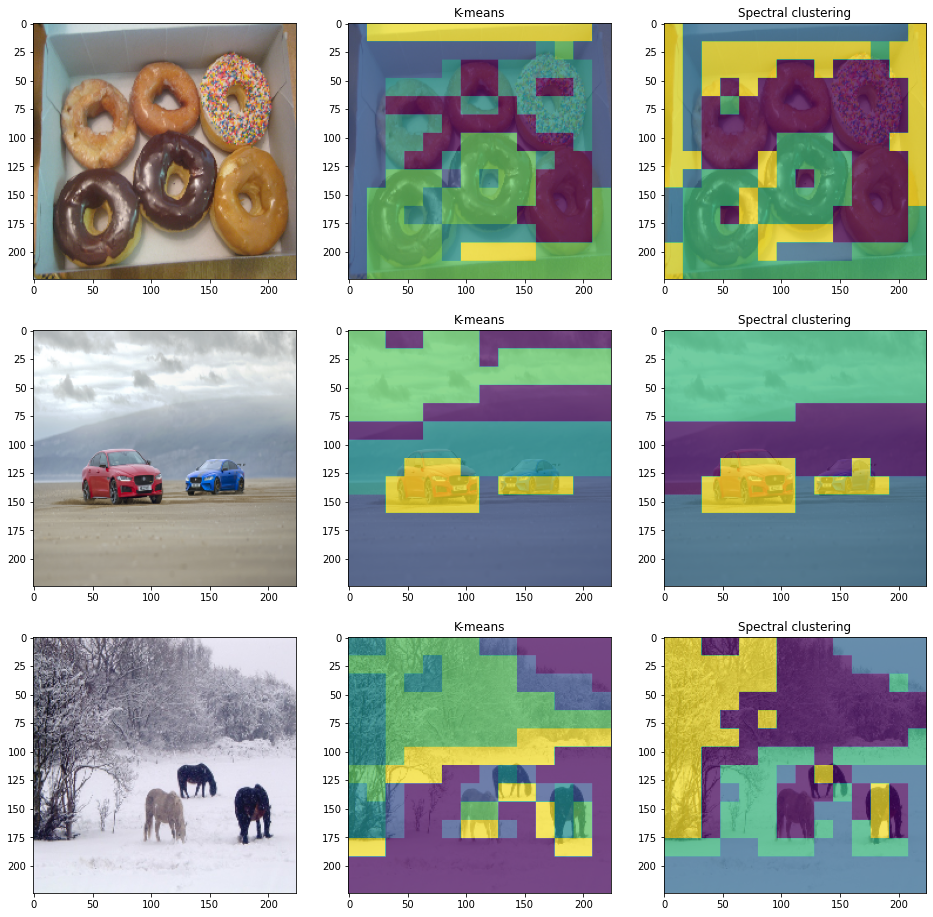

In [68]:
import torch.nn as nn
from torch.nn.functional import interpolate
from sklearn.cluster import SpectralClustering, KMeans
from sklearn.mixture import GaussianMixture

def custom_interpolate(preds, scale_factor):
    inp = torch.tensor(preds).reshape(14,14).unsqueeze(0).unsqueeze(0).float()
    sampled = torch.nn.UpsamplingNearest2d(scale_factor=scale_factor)(inp).detach().squeeze(0).squeeze(0)
    return sampled

fig, ax = plt.subplots(len(mae_imgs), 3, figsize=(16,16))

for i, (out, img) in enumerate(zip(mae_outs, mae_imgs)):
    x = out.last_hidden_state.squeeze(0).detach().cpu()[1:, :]

    bg = T.ToTensor()(img).squeeze(0).detach()
    bg = F.resize(bg, (224,224)).permute(1,2,0)
    ax[i, 0].imshow(bg, aspect='auto')

    sc = KMeans(5)
    preds = sc.fit_predict(x)
    sc_preds = custom_interpolate(preds, 16)
    ax[i, 1].imshow(bg, aspect='auto')
    ax[i, 1].imshow(sc_preds, alpha=0.7, aspect='auto')
    ax[i, 1].set_title("K-means")

    sc = GaussianMixture(4)
    preds = sc.fit_predict(x)
    sc_preds = custom_interpolate(preds, 16)
    ax[i, 2].imshow(bg, aspect='auto')
    ax[i, 2].imshow(sc_preds, alpha=0.7, aspect='auto')
    ax[i, 2].set_title("Spectral clustering")


# ax[0, 0].set_ylabel("CLS-to-patches", xy=(0, 0.5), size='large')
# ax[1, 0].set_ylabel("SpectralClustering self-attention", xy=(0, 0.5), xycoords=ax[1, 0], size='large')
plt.savefig("cls_to_rest.png", bbox_inches='tight')

### Define functions for visualizing attention between patches

In [112]:
import torch.nn as nn
from torch.nn.functional import interpolate
from sklearn.cluster import SpectralClustering, KMeans
from sklearn.mixture import GaussianMixture

def custom_interpolate(preds, scale_factor):
    inp = torch.tensor(preds).reshape(14,14).unsqueeze(0).unsqueeze(0).float()
    sampled = torch.nn.UpsamplingNearest2d(scale_factor=scale_factor)(inp).detach().squeeze(0).squeeze(0)
    return sampled

def visualize_heads(imgs, attentions_cls, attentions, heads, save_as, ks=[7, 3, 4], figsize=(24,24)):
    alpha = 0.5
    n_heads = len(heads)
    fig, ax = plt.subplots(12, n_heads + 1, figsize=figsize)

    for i, (bg, attn_cls, attn, k) in enumerate(zip(imgs, attentions_cls, attentions, ks)):
        bg = F.resize(bg, (224,224))
        attn_cls_to_rest = attn_cls[0, :, 0, 1:].reshape(12, 14, 14)
        upsampled = interpolate(attn_cls_to_rest.unsqueeze(0), scale_factor=16, mode="nearest")[0].cpu().numpy()

        for j in range(4):
            ax[i*4+j, 0].imshow(bg, aspect='auto')
            ax[i*4+j, 0].axis("off")
            if i == 0 and j == 0: ax[i*4, 0].set_title("Image")

        for j, head in zip(range(n_heads), heads):
            ax[i * 4, j+1].axis("off")
            ax[i * 4, j+1].imshow(bg, aspect='auto')
            ax[i * 4, j+1].imshow(upsampled[head - 1, :], alpha=alpha, aspect='auto')
            if i == 0: ax[i * 4, j+1].set_title(f"Head {head}")

        for j, head in zip(range(n_heads), heads):
            sc = SpectralClustering(n_clusters=k)
            preds = sc.fit_predict(attn[head - 1, :])
            sc_preds = custom_interpolate(preds, 16)
            ax[i*4+1, j+1].axis("off")
            ax[i*4+1, j+1].imshow(bg, aspect='auto')
            ax[i*4+1, j+1].imshow(sc_preds, alpha=alpha, aspect='auto')

        for j, head in zip(range(n_heads), heads):
            sc = GaussianMixture(k)
            preds = sc.fit_predict(attn[head - 1, :])
            sc_preds = custom_interpolate(preds, 16)
            ax[i*4+2, j+1].axis("off")
            ax[i*4+2, j+1].imshow(bg, aspect='auto')
            ax[i*4+2, j+1].imshow(sc_preds, alpha=alpha, aspect='auto')

        for j, head in zip(range(n_heads), heads):
            sc = KMeans(k)
            preds = sc.fit_predict(attn[head - 1, :])
            sc_preds = custom_interpolate(preds, 16)
            ax[i*4+3, j+1].axis("off")
            ax[i*4+3, j+1].imshow(bg, aspect='auto')
            ax[i*4+3, j+1].imshow(sc_preds, alpha=alpha, aspect='auto')
        
    plt.savefig(save_as, bbox_inches='tight')

### Visualize first 6 heads

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affin

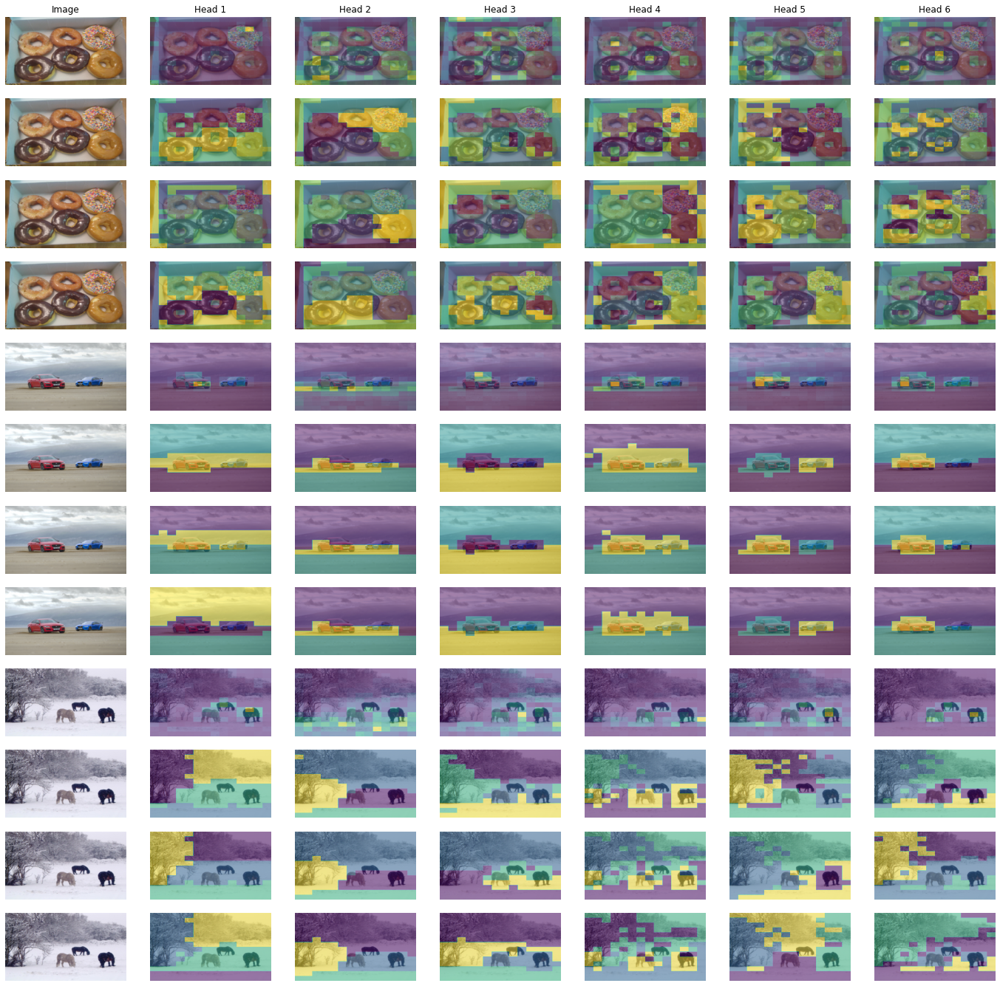

In [81]:
visualize_heads(imgs=mae_imgs, attentions_cls=mae_attentions_cls, attentions=mae_attentions, heads=range(1, 7), save_as="last-self-mae-first.png")

### Visualize last 7 heads

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affin

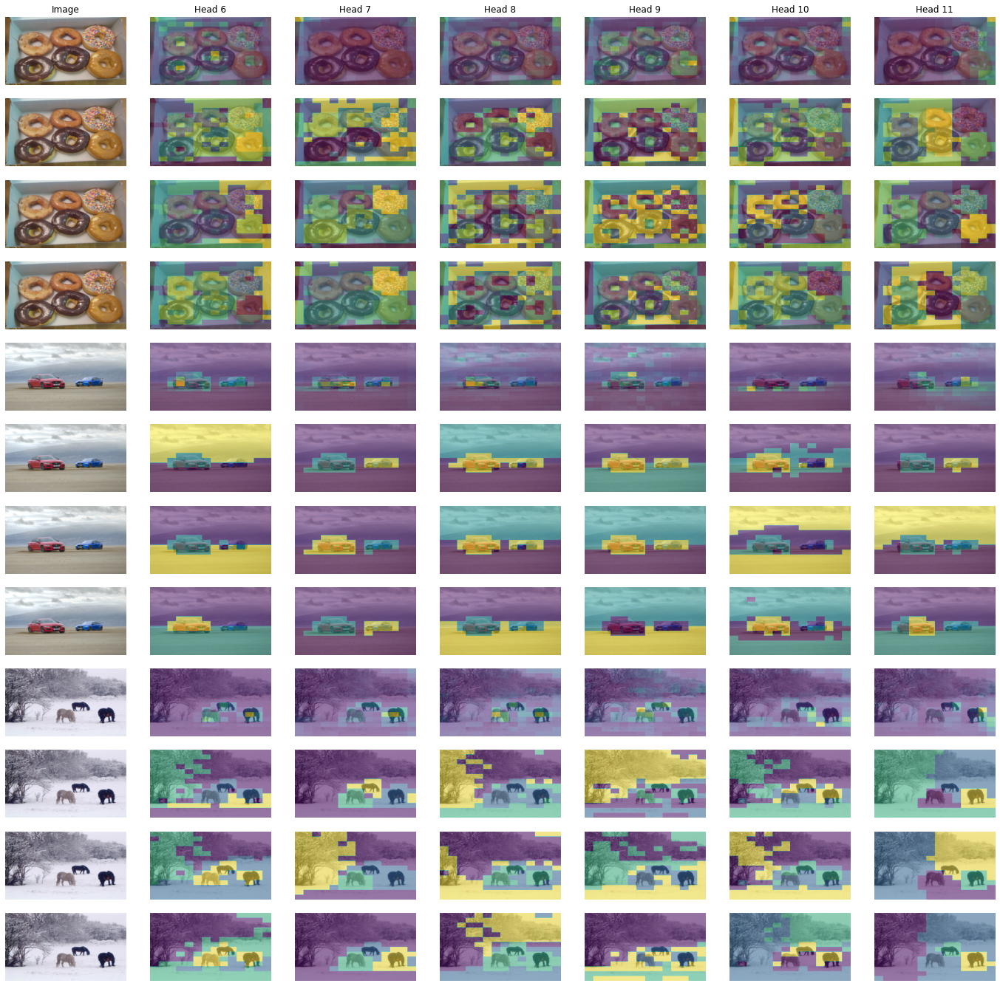

In [82]:
visualize_heads(imgs=mae_imgs, attentions_cls=mae_attentions_cls, attentions=mae_attentions, heads=range(6, 13), save_as="last-self-mae-second.png")

### Between patches, last 6 heads

Second embeddings

## DINO self-attention visualization

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affin

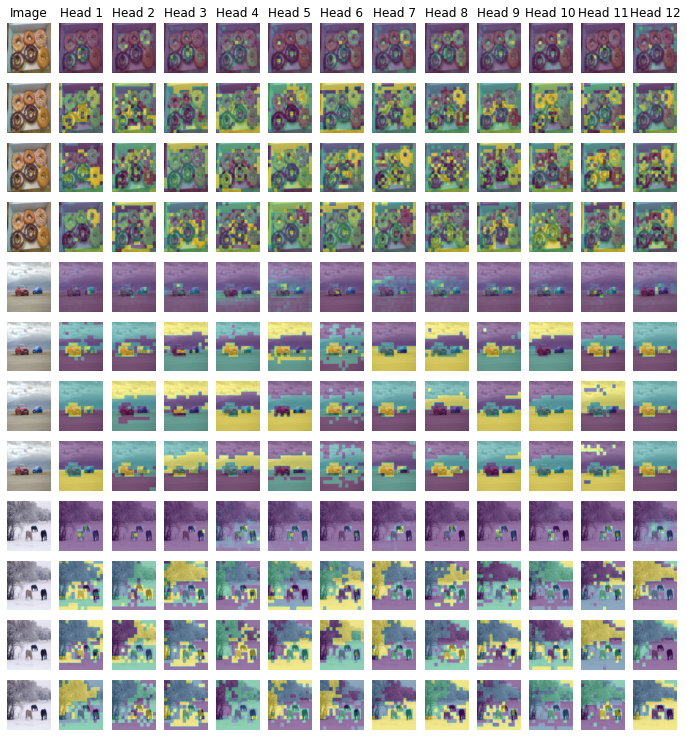

In [92]:
visualize_heads(imgs=dino_imgs, attentions_cls=dino_attentions_cls, attentions=dino_attentions, heads=range(1, 13), save_as="last-self-dino.png")

## Load more images to evaluate the seventh head

In [107]:
!wget http://farm9.staticflickr.com/8423/7513375682_5d4251fb46_z.jpg
!wget http://farm3.staticflickr.com/2720/4299021445_438c4da261_z.jpg
!wget http://farm8.staticflickr.com/7328/9699298160_453d0403bc_z.jpg
!wget http://farm8.staticflickr.com/7158/6744667173_4653f80aea_z.jpg
!mkdir extra
!mv *.jpg extra

--2022-12-26 15:13:41--  http://farm9.staticflickr.com/8423/7513375682_5d4251fb46_z.jpg
Resolving farm9.staticflickr.com (farm9.staticflickr.com)... 13.35.30.221, 2600:9000:213e:8c00:0:5a51:64c9:c681, 2600:9000:213e:e000:0:5a51:64c9:c681, ...
Connecting to farm9.staticflickr.com (farm9.staticflickr.com)|13.35.30.221|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://farm9.staticflickr.com/8423/7513375682_5d4251fb46_z.jpg [following]
--2022-12-26 15:13:41--  https://farm9.staticflickr.com/8423/7513375682_5d4251fb46_z.jpg
Connecting to farm9.staticflickr.com (farm9.staticflickr.com)|13.35.30.221|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘7513375682_5d4251fb46_z.jpg’

7513375682_5d4251fb     [ <=>                ] 106.81K  --.-KB/s    in 0.008s  

2022-12-26 15:13:42 (13.1 MB/s) - ‘7513375682_5d4251fb46_z.jpg’ saved [109377]

--2022-12-26 15:13:42--  http://farm3.staticflickr

## Create dataloader for the additional images

In [108]:
transform = T.Compose([
        T.Resize((640,640)),
        T.ToTensor()
])

dataset = MAEDataset('./extra', transform=transform)
dataloader = DataLoader(dataset, batch_size=1)

## Do predictions

In [109]:
attentions_cls = []
attentions = []
outs = []
imgs = []
for img in dataloader:
    last_attention, last_attention_cls, out = infer_model(mae, mae_extractor, img)
    img = T.ToPILImage()(img.squeeze(0))
    attentions_cls.append(last_attention_cls)
    attentions.append(last_attention)
    outs.append(out)
    imgs.append(img)

torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


## Self-attentions for the seventh head

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_spectral.py:589: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


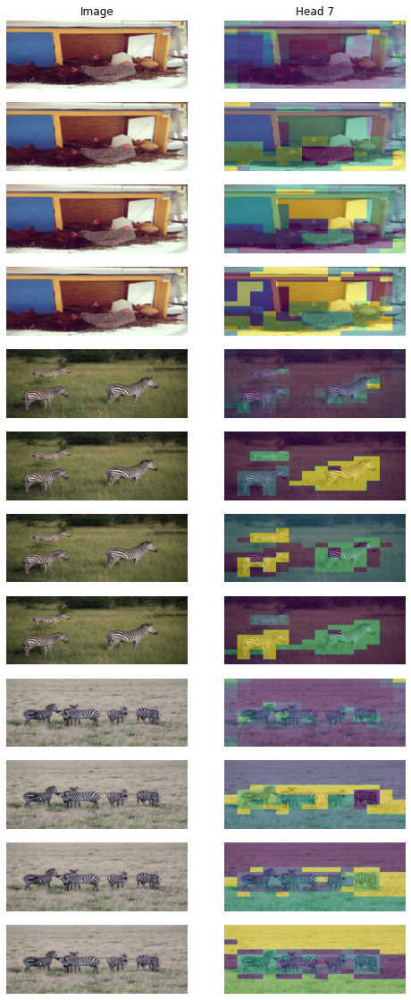

In [113]:
visualize_heads(imgs=imgs, attentions_cls=attentions_cls, ks=[6,4,6], attentions=attentions, heads=[7], save_as="self-seventh-extra.png", figsize=(8,20))

## Cluster the output embeddings

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

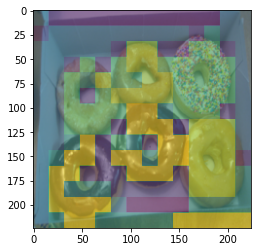

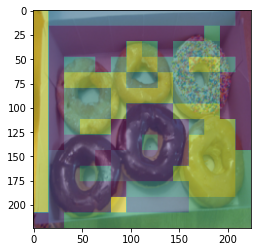

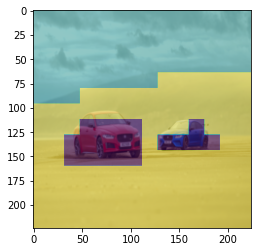

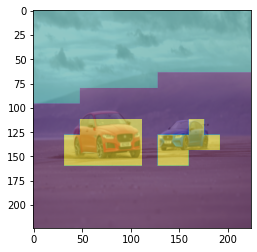

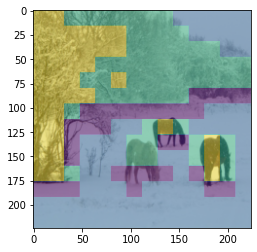

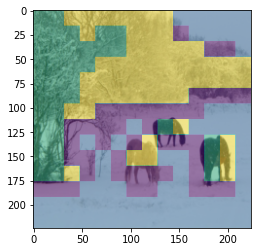

In [ ]:
from transformers.models.flava.modeling_flava import FlavaLosses
from scipy.ndimage import gaussian_filter
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import numpy as np
from google.colab import files


# fig, ax = plt.subplots(1,3, figsize=(12,12))
# ax = ax.flatten()

def interpolate(preds, scale_factor):
    inp = torch.tensor(preds).reshape(14,14).unsqueeze(0).unsqueeze(0).float()
    sampled = torch.nn.UpsamplingNearest2d(scale_factor=scale_factor)(inp).detach().squeeze(0).squeeze(0)
    return sampled

best_sc = -1
best_k = 0
sigma=5
download = True

show_bg = True


alpha = 0.5
for i, (bg, out, k, name) in enumerate(zip(imgs, outs, ks, ['donuts', 'cars', 'horses'])):
    bg = F.resize(bg, (224,224))
    x = out.last_hidden_state.squeeze(0).detach().cpu()[1:, :]

    gmm = GaussianMixture(k)
    gmm_preds = gmm.fit_predict(x)
    plt.figure()
    if show_bg: 
        sampled = interpolate(gmm_preds, 16)
        plt.imshow(bg)
    else:
        sampled = gmm_preds.reshape(14,14)

    plt.imshow(sampled, alpha=alpha)
    # plt.title(f'GMM, k: {k}')
    if download:
        fname = f'{name}_GMM_k_{k}.png'
        plt.savefig(fname, bbox_inches='tight')
        files.download(fname)

    km = KMeans(k)
    km_preds = km.fit_predict(x)
    plt.figure()
    if show_bg: 
        sampled = interpolate(km_preds, 16)
        plt.imshow(bg)
    else:
        sampled = km_preds.reshape(14,14)
    plt.imshow(sampled, alpha=alpha)
    # plt.title(f'KMeans, k: {k}')
    if download:
        fname = f'{name}_k_means_k_{k}.png'
        plt.savefig(fname, bbox_inches='tight')
        files.download(fname)


# EXTRA

In [ ]:
def visualize_self_attention(attn, title):
    car1_position = (4, 8)
    car2_position = (5, 4)
    car_index = lambda car: car[0] + car[1] * 14

    def vis(attn_shape, attn_tmp, first_str, second_str):
        fig, ax = plt.subplots(4,3, figsize=(16,16))
        ax = ax.flatten()
        for head in range(attn_shape): 
            ax[head].imshow(attn_tmp[head, ...].reshape(14,14))
            ax[head].scatter(car1_position[0], car1_position[1], c='r',marker='+')
            ax[head].scatter(car2_position[0], car2_position[1], c='r',marker='o')
            ax[head].set_title(f"{title} attention from {first_str} to {second_str}. Head: {head}")
        plt.savefig(f'{title}_self_attention_{first_str}_to_{second_str}.png')

    vis(attn.shape[0], attn[:, car_index(car1_position), :], 'patches', 'car1')
    vis(attn.shape[0], attn[:, :, car_index(car1_position)], 'car1', 'patches')
    vis(attn.shape[0], attn[:, car_index(car2_position), :], 'patches', 'car2')
    vis(attn.shape[0], attn[:, :, car_index(car2_position)], 'car2', 'patches')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


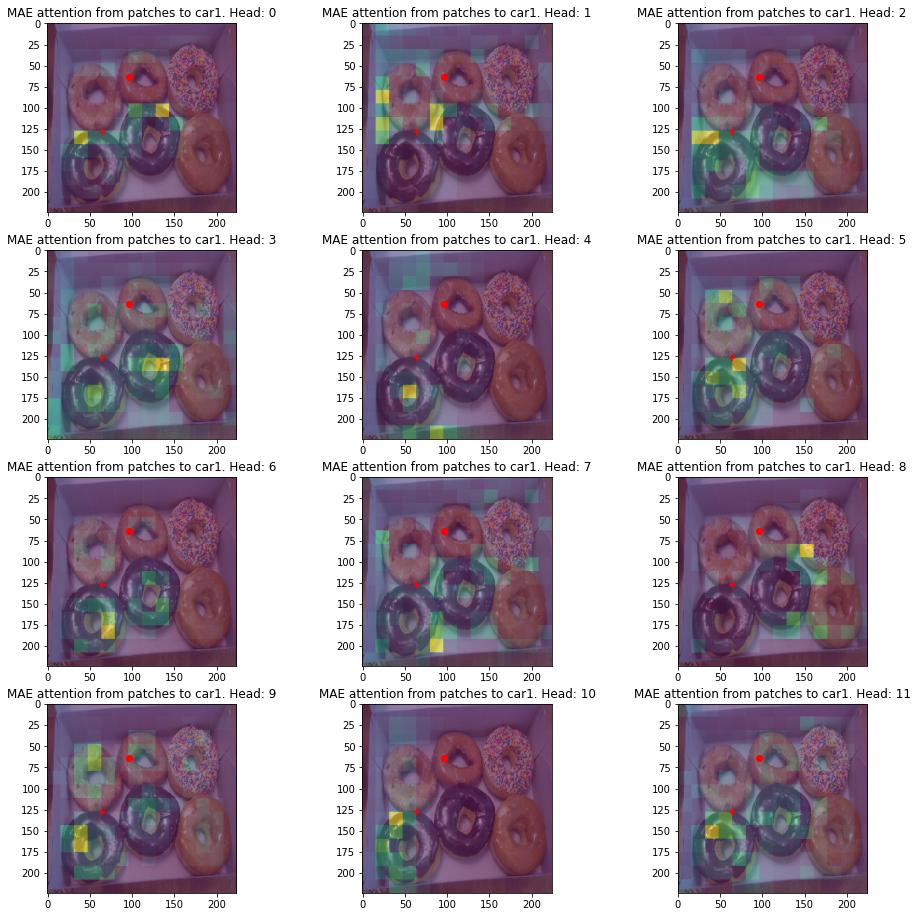

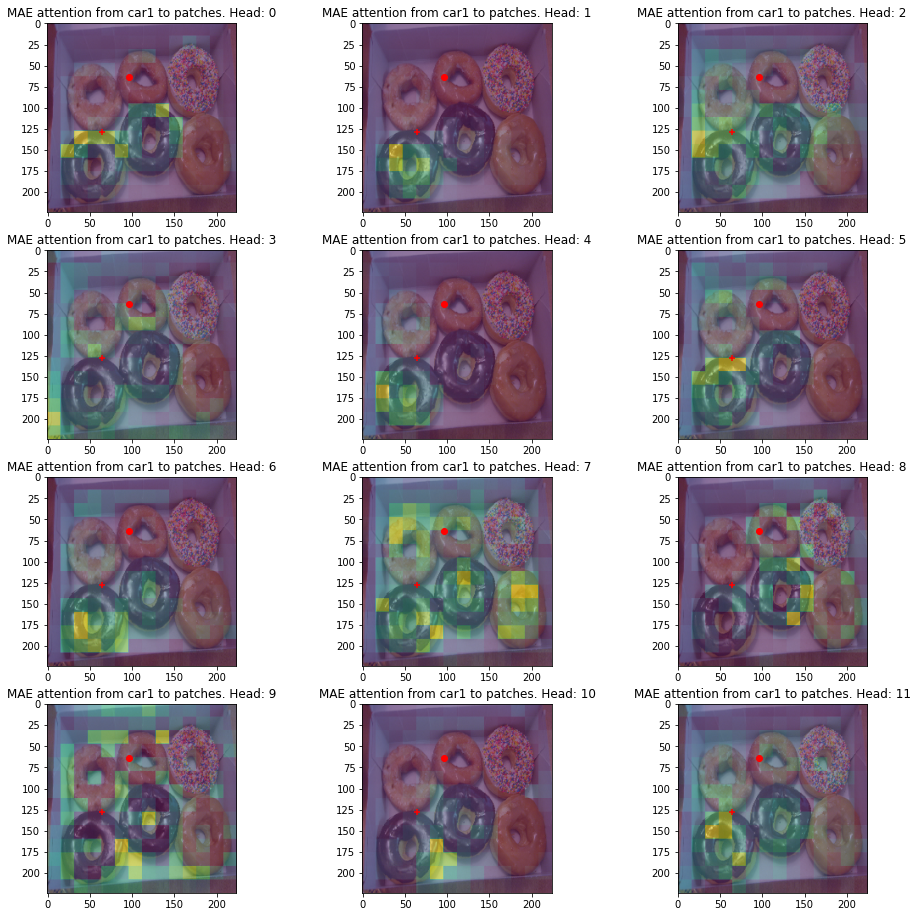

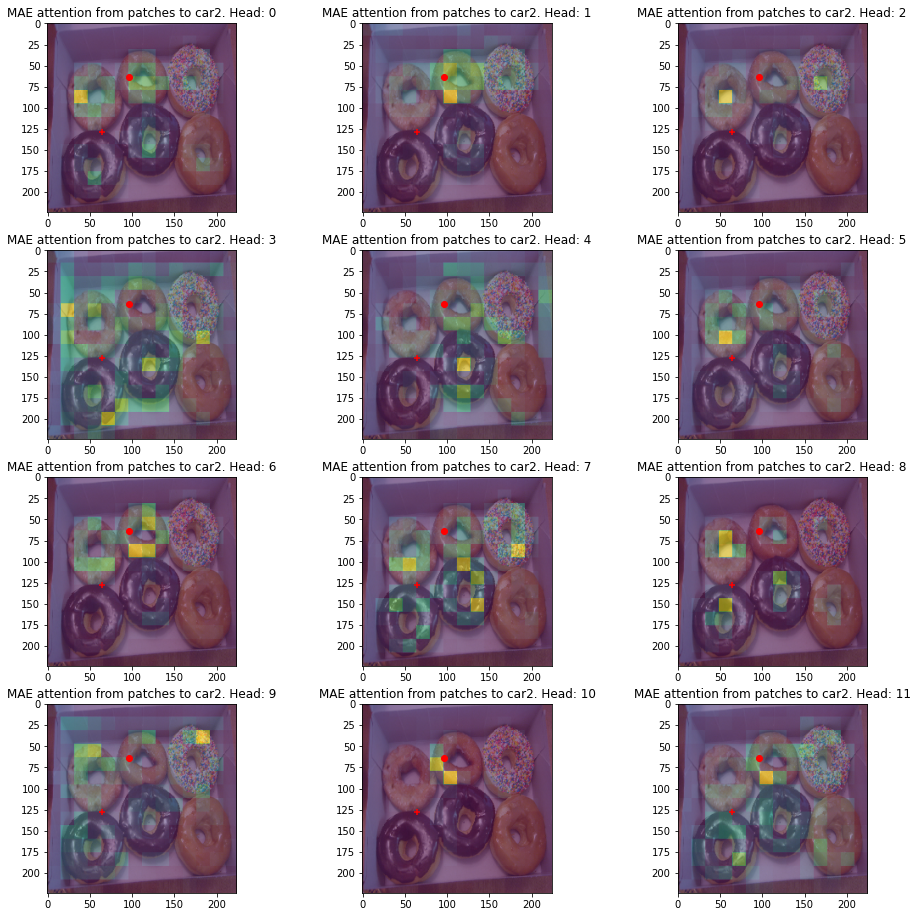

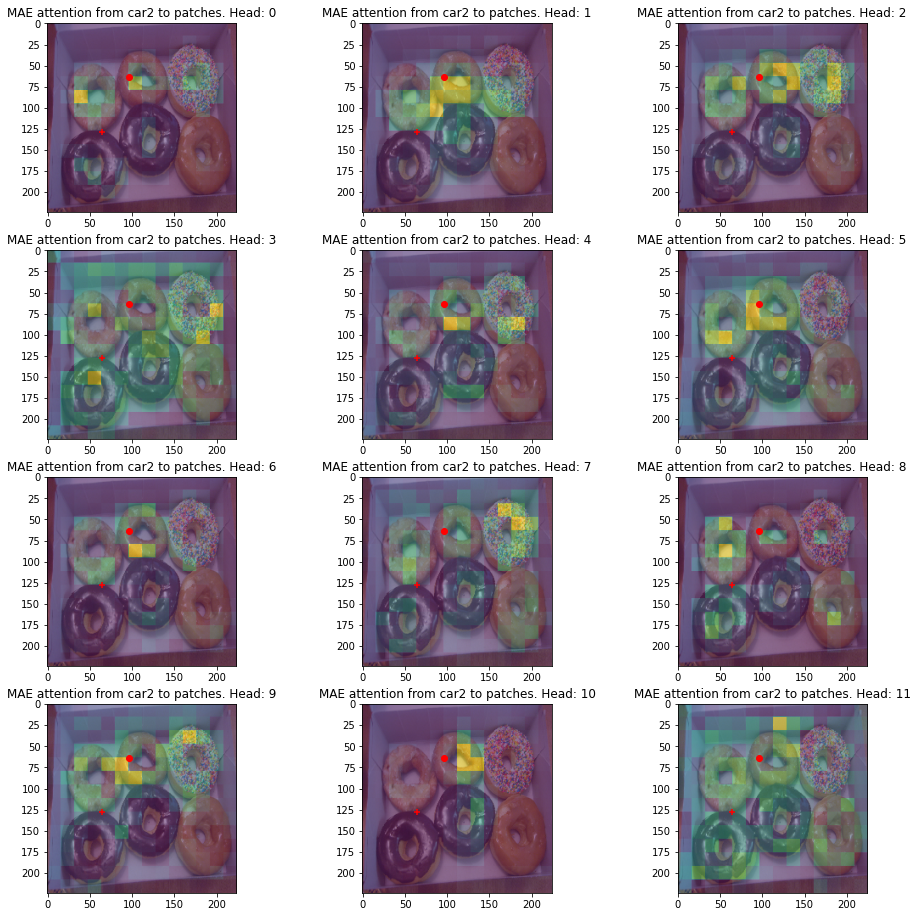

In [ ]:
visualize_self_attention(last_attention, 'MAE')